In [1]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
import xgcm
import cartopy.crs as ccrs
from cmocean import cm

from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *
from mitequinox.plot import *
from dask import compute, delayed

In [2]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6,  walltime='05:00:00')
w = cluster.scale(12*6)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [12]:
client

Client Scheduler: tcp://10.135.37.67:45161 Dashboard: /user/yux/proxy/8787/status,Cluster Workers: 30 Cores: 30 Memory: 500.10 GB


_____________
# 1. Read data

In [7]:
#grd = load_grd(ftype='nc').reset_coords()
grd = load_grd().reset_coords()
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([mask, grd.dxC, grd.dyC, grd.Depth, grd.rA, grd.XC,grd.YC])

# coriolis term
lat = grd_rspec['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat))
f_ij

ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
ice = ds_ice.AREA

In [8]:
time_length = 8785
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,15,0)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(time_length))

In [9]:
dsU = xr.open_zarr(root_data_dir+'zarr/%s.zarr'%('SSU'))
dsV = xr.open_zarr(root_data_dir+'zarr/%s.zarr'%('SSV'))
ds_raw = (xr.merge([dsU,dsV]).assign_coords(**grd.variables))
ds_raw = ds_raw.assign_coords(time=time_day) 
grid = xgcm.Grid(ds_raw, periodic=['X', 'Y'])
print(ds_raw)
print('dataset size: %.1f GB' %(ds_raw.nbytes / 1e9))

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, k: 90, k_l: 90, k_p1: 91, k_u: 90, time: 8785)
Coordinates:
    dtime    (time) datetime64[ns] dask.array<chunksize=(8785,), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    iters    (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ... 2012-11-15
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    CS       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    PHrefC   (k) float32 dask.array<chunksize=(90,), meta=np.ndarray>
    PHr

_____________
# 2. Calculate zeta and store

## 2.1 subsample (1080*1080)

In [84]:
# No need to do these for KE, but it's necessary to do for zeta (i.e. no need to ratote uv first to compute zeta)
E_dir = '/work/ALT/swot/aval/syn/xy/comparison/Movies/'
dij=4

for face in range(13):
#for face in [2]:

    zeta_3 = (grid.diff(ds_raw.dyC.isel(face=face) * ds_raw.SSV.isel(face=face),'X') - grid.diff(ds_raw.dxC.isel(face=face) * ds_raw.SSU.isel(face=face),'Y'))/ds_raw.rAz.isel(face=face) # relative vorticity  
    zeta = zeta_3.rename({'j_g': 'j', 'i_g': 'i'}).isel(i=slice(0,None,dij), j=slice(0,None,dij))   #(zeta) at i,j
    zeta = np.real(zeta).rename('zeta')
    zeta = zeta.chunk({'time': 1,'i':1080,'j':1080})
    #print(zeta)
    %time zeta.to_dataset().to_zarr(E_dir+'zeta_subsample_f%02d.zarr'% (face), mode='w')

    print('face=%d - allready processed'%(face))

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 24.1 s, sys: 985 ms, total: 25 s
Wall time: 28.8 s
face=0 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 24.2 s, sys: 920 ms, total: 25.1 s
Wall time: 26.5 s
face=1 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.5 s, sys: 974 ms, total: 26.5 s
Wall time: 27.4 s
face=2 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 26 s, sys: 1.06 s, total: 27.1 s
Wall time: 27.6 s
face=3 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.9 s, sys: 1.27 s, total: 27.1 s
Wall time: 28.1 s
face=4 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.8 s, sys: 1.59 s, total: 27.4 s
Wall time: 27.7 s
face=5 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 27.9 s, sys: 1.9 s, total: 29.8 s
Wall time: 31.2 s
face=6 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.2 s, sys: 1.51 s, total: 26.7 s
Wall time: 28.3 s
face=7 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 24.4 s, sys: 1.07 s, total: 25.5 s
Wall time: 26.8 s
face=8 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 24.8 s, sys: 1.14 s, total: 26 s
Wall time: 27.1 s
face=9 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.1 s, sys: 1.16 s, total: 26.3 s
Wall time: 27.1 s
face=10 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 25.8 s, sys: 1.08 s, total: 26.9 s
Wall time: 29.4 s
face=11 - allready processed


/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


CPU times: user 24.1 s, sys: 1.05 s, total: 25.1 s
Wall time: 26.2 s
face=12 - allready processed


## 2.2 all data (4320*4320)

In [13]:
# No need to do these for KE, but it's necessary to do for zeta (i.e. no need to ratote uv first to compute zeta)
E_dir = '/work/ALT/swot/aval/syn/xy/comparison/Movies/'
dij=1

#for face in range(13):
for face in [2]:

    zeta_3 = (grid.diff(ds_raw.dyC.isel(face=face) * ds_raw.SSV.isel(face=face),'X') - grid.diff(ds_raw.dxC.isel(face=face) * ds_raw.SSU.isel(face=face),'Y'))/ds_raw.rAz.isel(face=face) # relative vorticity  
    zeta = zeta_3.rename({'j_g': 'j', 'i_g': 'i'}).isel(i=slice(0,None,dij), j=slice(0,None,dij))   #(zeta) at i,j
    zeta = np.real(zeta).rename('zeta')
    zeta = zeta.chunk({'time': 1,'i':4320,'j':4320})
    print(zeta)
    print('dataset size: %.1f GB' %(zeta.nbytes / 1e9))
    %time zeta.to_dataset().to_zarr(E_dir+'zeta_yearlong_f%02d.zarr'% (face), mode='w')

    print('face=%d - allready processed'%(face))

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/dask/array/core.py:4241: PerformanceWarning: Increasing number of chunks by factor of 20
  result = blockwise(


<xarray.DataArray 'zeta' (j: 4320, i: 4320, time: 8785)>
dask.array<rechunk-merge, shape=(4320, 4320, 8785), dtype=float32, chunksize=(4320, 4320, 1), chunktype=numpy.ndarray>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ... 2012-11-15
    face     int64 2
    XG       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YG       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    rAz      (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
dataset size: 655.8 GB
CPU times: user 16min 41s, sys: 24.3 s, total: 17min 5s
Wall time: 17min 8s
face=2 - allready processed


_______________
# 3. Quick looks

## figure per face

In [ ]:
E_dir = '/work/ALT/swot/aval/syn/xy/comparison/Movies/' 

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


(30.0, 55.0)

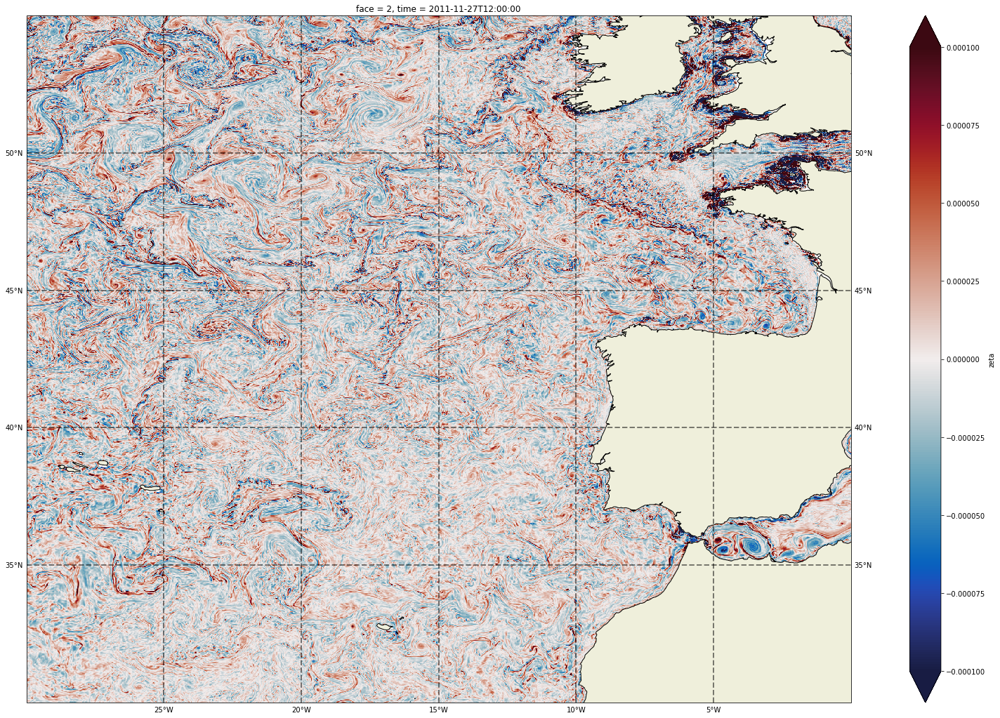

In [9]:
face = 2
ds = xr.open_zarr(E_dir+'zeta_f%02d.zarr'%(face))              
ds = ds.assign_coords(time=time_day) 
zeta = ds['zeta'].isel(time=100, i=slice(0,2000), j=slice(0,4000)) 

fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-1e-4, vmax=1e-4,cmap=cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='10m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_xlim(-30., 0.)
ax.set_ylim(30., 55.)

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


(15.0, 65.0)

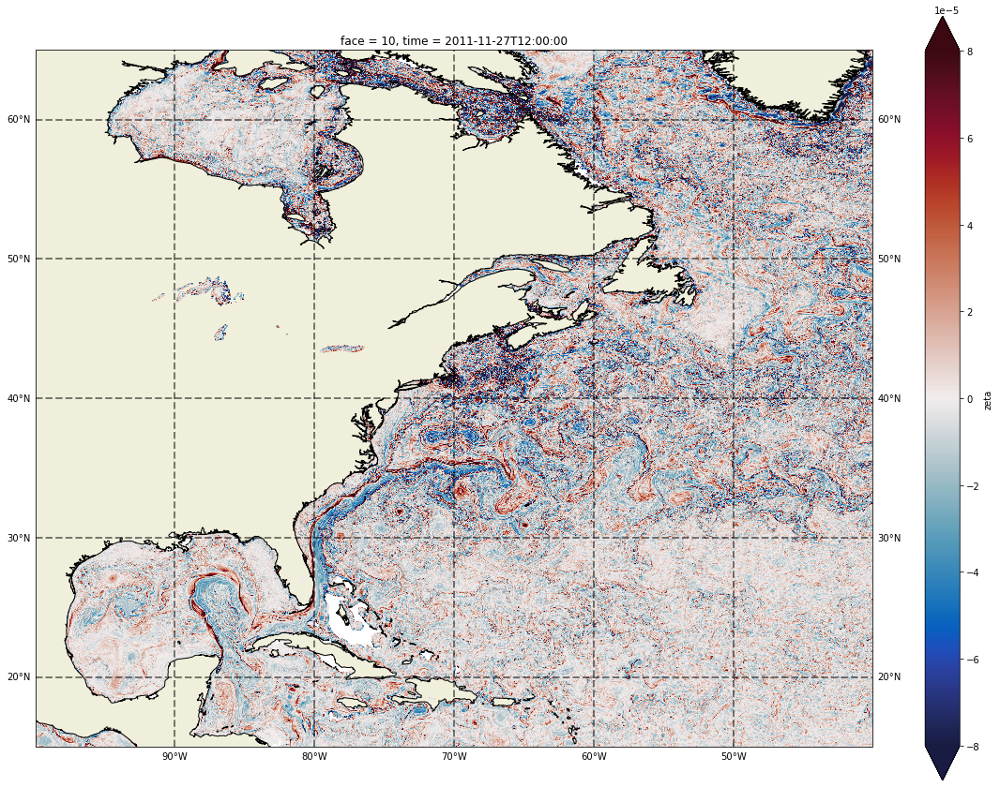

In [13]:
face = 10
ds = xr.open_zarr(E_dir+'zeta_f%02d.zarr'%(face))              
ds = ds.assign_coords(time=time_day) 
zeta = ds['zeta'].isel(time=100) 

fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-8e-5, vmax=8e-5, cmap=cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='10m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_xlim(-100., -40.)
ax.set_ylim(15., 65.)

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


(60.0, 140.0)

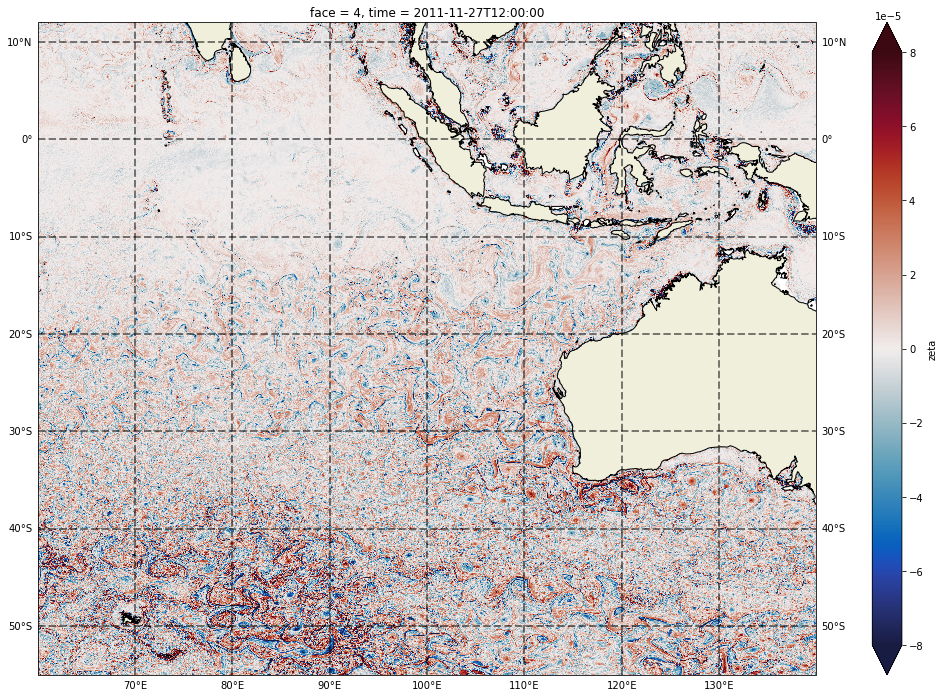

In [14]:
face = 4
ds = xr.open_zarr(E_dir+'zeta_f%02d.zarr'%(face))              
ds = ds.assign_coords(time=time_day) 
zeta = ds['zeta'].isel(time=100) 

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-8e-5, vmax=8e-5, cmap=cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='10m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_ylim(-55., 12.)
ax.set_xlim(60., 140.)

## Global map

In [85]:
E_dir = '/work/ALT/swot/aval/syn/xy/comparison/Movies/'
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_zeta = xr.concat([xr.open_zarr(E_dir+'zeta_subsample_f%02d.zarr'%(face)) for face in F], dim='face', compat='identical')
print(ds_zeta)
print('dataset size: %.1f GB' %(ds_zeta.nbytes / 1e9))

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080, time: 120)
Coordinates:
    XG       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YG       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    rAz      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
  * time     (time) datetime64[ns] 2011-11-23T08:00:00 ... 2011-11-28T07:00:00
Data variables:
    zeta     (face, j, i, time) float32 dask.array<chunksize=(1, 1080, 1080, 1), meta=np.ndarray>
dataset size: 7.5 GB


In [27]:
import cartopy.feature as cfeature
font_size = 32

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal', coast_resolution='110m',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=0))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XG<=179.9) & (vplt.XG>=0.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where( (vplt.XG>-179.9) & (vplt.XG<=0) ).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)              
                
        cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, cax=cax, ticks=[-4e-5, -3e-5, -2e-5, -1e-5, 0, 1e-5, 2e-5, 3e-5, 4e-5])
        cb.ax.set_yticklabels(['-4','-3','-2','-1','0','1','2','3','4'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_title('',fontsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$'])
        ax.set_ylim(-70., 70.)
        ax.set_yticks([-70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70])
        ax.set_yticklabels(['','$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N',''])
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)

        if coast_resolution is not None:
            ax.coastlines(resolution=coast_resolution, color='k')
        ax.add_feature(cfeature.LAND)        
        
        if title is not None:
            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=300)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [28]:
# save not shown
plot_pretty(ds_zeta.zeta.sel(time='2011-11-24T08:00:00').isel(i=slice(1,-1),j=slice(1,-1)).where(ice>0), label=r'Relative vorticity ($\times$ 10$^{-5}$ s$^{-1}$)', vmin = -4e-5, vmax=4e-5, cmmap='balance', figsize=(28,16.8), ignore_face=[6], savefig='/home/uz/yux/mit_equinox_backup/hal/Geostrophy_assessment/Figures/Figure_zeta_dpi300.png')

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically incr

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically incr

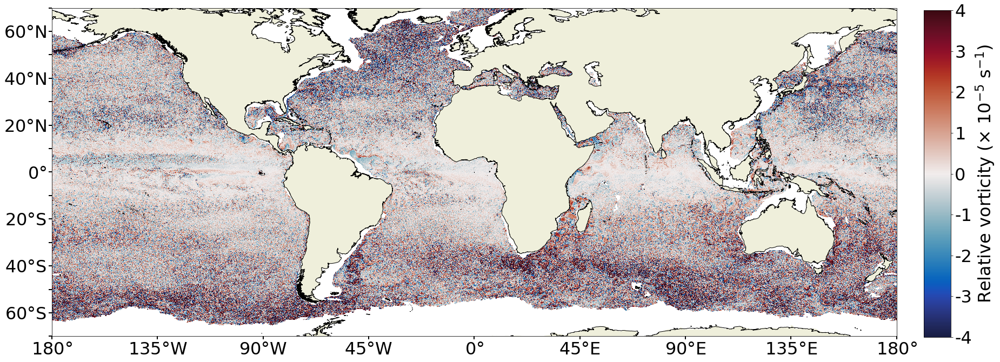

In [26]:
# show
dij=4
plot_pretty(ds_zeta.zeta.sel(time='2011-11-24T08:00:00').isel(i=slice(1,-1),j=slice(1,-1)).isel(i=slice(0,None,dij), j=slice(0,None,dij)).where( (ice>0) & (grd_rspec.Depth>500) ), label=r'Relative vorticity ($\times$ 10$^{-5}$ s$^{-1}$)', vmin = -4e-5, vmax=4e-5, cmmap='balance', figsize=(28,16.8), ignore_face=[6])

___________
# 4. Movies

## 4.1 global

In [89]:
import cartopy.feature as cfeature
font_size = 28

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal', coast_resolution='110m',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=0))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XG<=179.9) & (vplt.XG>=0.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where( (vplt.XG>-179.9) & (vplt.XG<=0) ).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)              
                
        #cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, ax=ax, ticks=[-4e-5, -3e-5, -2e-5, -1e-5, 0, 1e-5, 2e-5, 3e-5, 4e-5])
        cb.ax.set_yticklabels(['-4','-3','-2','-1','0','1','2','3','4'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$'])
        ax.set_ylim(-70., 70.)
        ax.set_yticks([-70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70])
        ax.set_yticklabels(['','$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N',''])
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)
        ax.set_title(title[0],fontsize=font_size)
        
        if coast_resolution is not None:
            ax.coastlines(resolution=coast_resolution, color='k')
        ax.add_feature(cfeature.LAND)        
        
#        if title is not None:
#            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=240)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [92]:
dij=1
vmin, vmax = -4e-5, 4e-5
lds = ds_zeta


def ssufig(ds_zeta, i, overwrite=True):
    
    # !! passing the variable does not work
    dv = (ds_zeta.zeta.isel(i=slice(1,-1),j=slice(1,-1)).isel(i=slice(0,None,dij), j=slice(0,None,dij))).where(ice>0)
    #dv = (ds_zeta.zeta.isel(i=slice(1,-1),j=slice(1,-1))).where(ice>0)
    mtime = time_day[i]
    figname = '/home/uz/yux/mit_equinox_backup/hal/Geostrophy_assessment/Figures/Global_Zeta/Zeta_subsample_t%04d' %(i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['Relative vorticity %s'%mtime]
        label = r'$\zeta$ ($\times$ 10$^{-5}$ s$^{-1}$)'
        plot_pretty(dv, vmin=vmin, vmax=vmax, cmmap='balance', title=title, label=label, savefig=figname, ignore_face=[6], figsize=(20,6))

        #m = 1.
        m = float(dv.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds_zeta['time']))
#I = range(4)
print(I)
values = [delayed(ssufig)(lds.isel(time=i), i) for i in I]

range(0, 120)


Process all times

In [93]:
futures = client.compute(values)
%time results = client.gather(futures)

CPU times: user 2min 45s, sys: 5min 8s, total: 7min 54s
Wall time: 13min 24s


______________
## 4.2 One face

In [14]:
E_dir = '/work/ALT/swot/aval/syn/xy/comparison/Movies/' 
face = 2
ds = xr.open_zarr(E_dir+'zeta_yearlong_f%02d.zarr'%(face))              
ds = ds.assign_coords(time=time_day) 
ds

<xarray.Dataset>
Dimensions:  (i: 4320, j: 4320, time: 8785)
Coordinates:
    XG       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YG       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    face     int64 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    rAz      (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
  * time     (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ... 2012-11-15
Data variables:
    zeta     (j, i, time) float32 dask.array<chunksize=(4320, 4320, 1), meta=np.ndarray>

In [15]:
font_size = 16
linewidith = 0.5

def plot_scalar_face01(v1, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                       offline=False, figsize=(10,10), cmap=None):
    #
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)

        try:
            
            ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
            im = v1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XG', y='YG', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im, ax=ax, ticks=[-1, -0.5, 0, 0.5, 1])
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[0],fontsize=24) 
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-30., 0.)
            ax.set_xticks([-30.,-25.,-20.,-15.,-10.,-5.,0])
            ax.set_xticklabels(['$30\degree$W','$25\degree$W','$20\degree$W','$15\degree$W','$10\degree$W','$5\degree$W','$0\degree$'])
            #ax.set_ylim(30., 55.)
            #ax.set_yticks([30., 35., 40., 45., 50., 55.])
            #ax.set_yticklabels(['$30\degree$N','$35\degree$N','$40\degree$N','$45\degree$N','$50\degree$N','$55\degree$N'])
            ax.set_ylim(40., 55.)
            ax.set_yticks([40., 45., 50., 55.])
            ax.set_yticklabels(['$40\degree$N','$45\degree$N','$50\degree$N','$55\degree$N'])            
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='10m', color='k')
            ax.add_feature(cfeature.LAND)    
            #ax.scatter(343.8125,48.6875,s=50,marker='x',color='g',linewidth=2)
            lat_OSMOSIS_max = 50
            lat_OSMOSIS_min = 47.4
            lon_OSMOSIS_max = -18.04
            lon_OSMOSIS_min = -14.38
            ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_min], [lat_OSMOSIS_max,lat_OSMOSIS_max], color='g', linewidth=2 )
            ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_min], [lat_OSMOSIS_min,lat_OSMOSIS_min], color='g', linewidth=2 )
            ax.plot([lon_OSMOSIS_min,lon_OSMOSIS_min], [lat_OSMOSIS_min,lat_OSMOSIS_max], color='g', linewidth=2 )
            ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_max], [lat_OSMOSIS_min,lat_OSMOSIS_max], color='g', linewidth=2 )
            

        except:
            pass
          
        if savefig is not None:
            fig.savefig(savefig, dpi=300)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [18]:
vmin, vmax = -1, 1
lds = ds

def process(ds, i, overwrite=True):    
    
    zeta = ds['zeta']/f_ij.isel(face=2)
    
    #mtime = ds['time'].values/86400
    mtime = time_day[i]
    figname = '/home/uz/yux/mit_equinox_backup/hal/Geostrophy_assessment/Figures/Global_Zeta/Zeta_f%02d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['%s \n $\zeta/f$' %mtime, 'u (m/s)', '$u_g$ (m/s)', '$u_a$ (m/s)']
        label = ['', '', '', '']
        
        plot_scalar_face01(zeta, colorbar=False, title=title, label=label, savefig=figname, vmin=vmin, vmax=vmax,
                           offline=False, figsize=(15,6), cmap=cm.balance)
        #
        m = float(zeta.mean().values)
    else:
        m = -1.
    return m

I = np.arange(0,4)
I = np.arange(0,8785,24)

print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]

[   0   24   48   72   96  120  144  168  192  216  240  264  288  312
  336  360  384  408  432  456  480  504  528  552  576  600  624  648
  672  696  720  744  768  792  816  840  864  888  912  936  960  984
 1008 1032 1056 1080 1104 1128 1152 1176 1200 1224 1248 1272 1296 1320
 1344 1368 1392 1416 1440 1464 1488 1512 1536 1560 1584 1608 1632 1656
 1680 1704 1728 1752 1776 1800 1824 1848 1872 1896 1920 1944 1968 1992
 2016 2040 2064 2088 2112 2136 2160 2184 2208 2232 2256 2280 2304 2328
 2352 2376 2400 2424 2448 2472 2496 2520 2544 2568 2592 2616 2640 2664
 2688 2712 2736 2760 2784 2808 2832 2856 2880 2904 2928 2952 2976 3000
 3024 3048 3072 3096 3120 3144 3168 3192 3216 3240 3264 3288 3312 3336
 3360 3384 3408 3432 3456 3480 3504 3528 3552 3576 3600 3624 3648 3672
 3696 3720 3744 3768 3792 3816 3840 3864 3888 3912 3936 3960 3984 4008
 4032 4056 4080 4104 4128 4152 4176 4200 4224 4248 4272 4296 4320 4344
 4368 4392 4416 4440 4464 4488 4512 4536 4560 4584 4608 4632 4656 4680
 4704 

In [19]:
futures = client.compute(values)
%time results = client.gather(futures)

CPU times: user 1min 1s, sys: 1min 34s, total: 2min 35s
Wall time: 7min


In [38]:
lat_OSMOSIS_max = 50
lat_OSMOSIS_min = 47.4
lon_OSMOSIS_max = -18.04
lon_OSMOSIS_min = -14.38

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


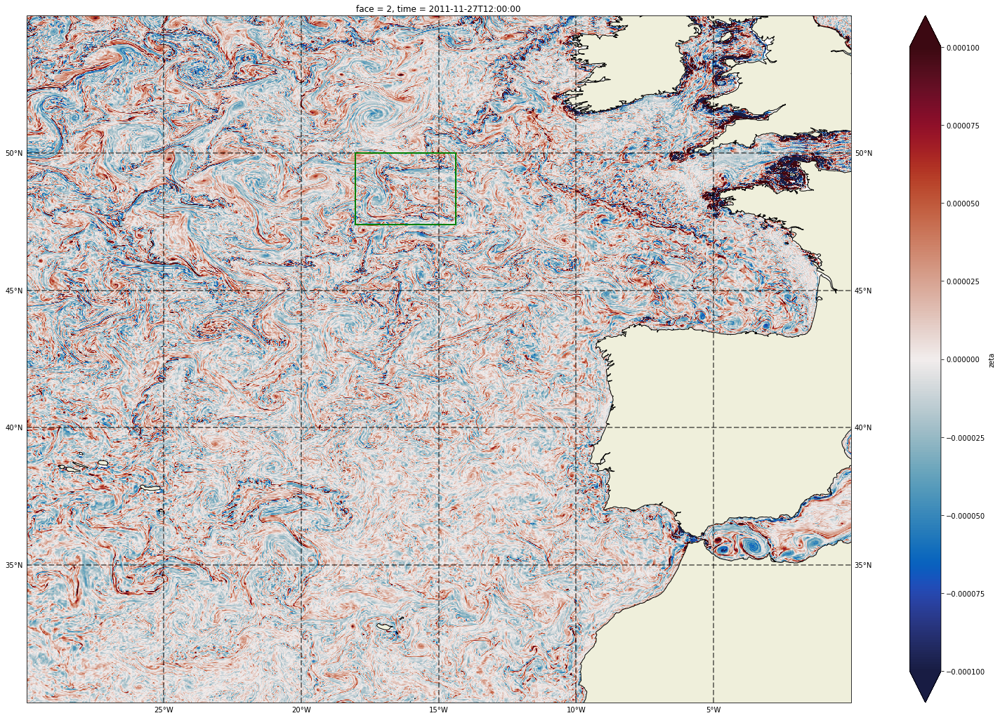

In [41]:
zeta = ds['zeta'].isel(time=100, i=slice(0,2000), j=slice(0,4000)) 

fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-1e-4, vmax=1e-4,cmap=cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='10m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_xlim(-30., 0.)
ax.set_ylim(30., 55.)

lat_OSMOSIS_max = 50
lat_OSMOSIS_min = 47.4
lon_OSMOSIS_max = -18.04
lon_OSMOSIS_min = -14.38
ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_min], [lat_OSMOSIS_max,lat_OSMOSIS_max], color='g', linewidth=2 )
ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_min], [lat_OSMOSIS_min,lat_OSMOSIS_min], color='g', linewidth=2 )
ax.plot([lon_OSMOSIS_min,lon_OSMOSIS_min], [lat_OSMOSIS_min,lat_OSMOSIS_max], color='g', linewidth=2 )
ax.plot([lon_OSMOSIS_max,lon_OSMOSIS_max], [lat_OSMOSIS_min,lat_OSMOSIS_max], color='g', linewidth=2 )

In [ ]:
cluster.close()

In [48]:
# read data
face =4
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij), face=face)

ds = xr.open_zarr(work_data_dir+'xy/comparison/Movies/Eta_SSU_f%02d.zarr'%(face))
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,23,8)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(time_length))
ds = ds.assign_coords(time=time_day) 
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

<xarray.Dataset>
Dimensions:  (i: 1080, j: 1080, time: 240)
Coordinates:
    Depth    (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dtime    (time) datetime64[ns] dask.array<chunksize=(240,), meta=np.ndarray>
    dxG      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dyG      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    f_i      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    f_j      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    face     int64 ...
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    iters    (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    mask     (j, i) int8 dask.arr

In [49]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

D = [xr.open_zarr(work_data_dir+'xy/total_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_total = xr.concat(D, dim='face')
E_total = ds_total.E_all
E_total_low = ds_total.E_low

D = [xr.open_zarr(work_data_dir+'xy/geo_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_geo = xr.concat(D, dim='face')
E_geo = ds_geo.E_all

D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo = xr.concat(D, dim='face')
E_ageo = ds_ageo.E_all
E_ageo_low = ds_ageo.E_low
E_ageo_high = ds_ageo.E_high

In [50]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

D = [xr.open_zarr(work_data_dir+'xy/total_uv_all/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_total_all = xr.concat(D, dim='face')
E_total_all = ds_total_all.E_all
E_total_all_low = ds_total_all.E_low

D = [xr.open_zarr(work_data_dir+'xy/geo_uv_all/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_geo_all = xr.concat(D, dim='face')
E_geo_all = ds_geo_all.E_all

D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv_all/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo_all = xr.concat(D, dim='face')
E_ageo_all = ds_ageo_all.E_all
E_ageo_all_low = ds_ageo_all.E_low

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


(60.0, 140.0)

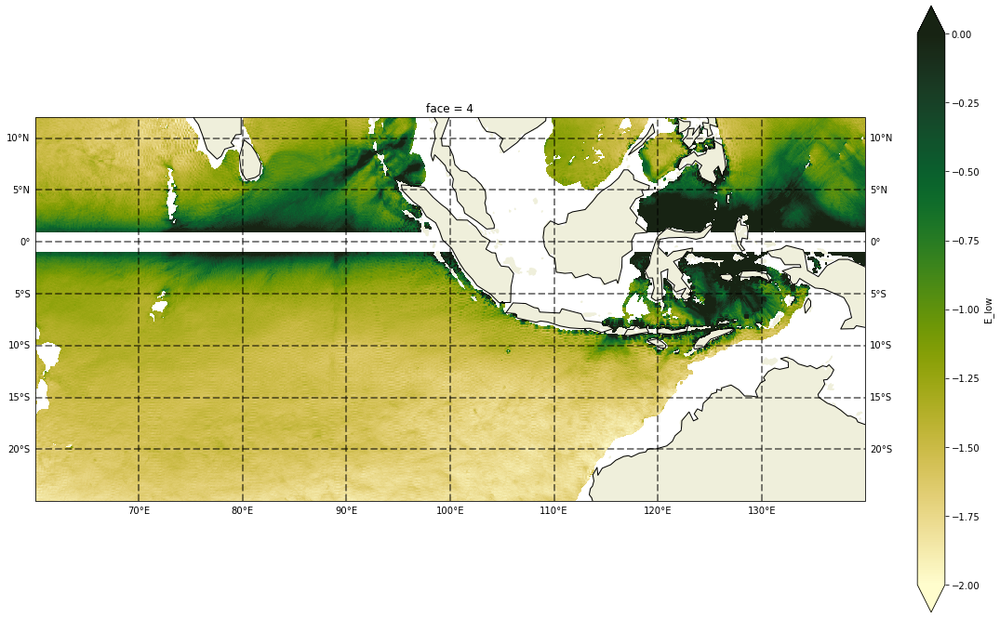

In [63]:
E_low_4 = ds_ageo_all.E_low.isel(face=face)
eta1=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
eta1.plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=-2, vmax=0, cmap=cm.speed)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='110m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_ylim(-25., 12.)
ax.set_xlim(60., 140.)

In [53]:
E_low_4 = ds_ageo_all.E_high.isel(face=4)
eta1=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

In [54]:
E_low_4 = ds_ageo_all.E_low.isel(face=4)
eta2=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

In [64]:
font_size = 15
linewidith = 0.5

def plot_scalar_face01(v1, v2, v3, v4, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                       offline=False, figsize=(15,10), cmap=None):
    #
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)

        try:
            
            ## subplot 221
            ax = fig.add_subplot(321, projection=ccrs.PlateCarree())
            im = v1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            #cax = plt.axes([0.925, 0.25, 0.025, 0.5])
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[0],fontsize=font_size) 
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
            
            ## subplot 222
            ax = fig.add_subplot(322, projection=ccrs.PlateCarree())
            im = v2.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[1],fontsize=font_size)                        
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
                   
            ## subplot 223
            ax = fig.add_subplot(323, projection=ccrs.PlateCarree())
            im = v3.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[2],fontsize=font_size)                        
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
                        
            ## subplot 224
            ax = fig.add_subplot(324, projection=ccrs.PlateCarree())
            im = v4.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[3],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
 
                        
            ## subplot 224
            ax = fig.add_subplot(325, projection=ccrs.PlateCarree())
            im = eta2.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=-2, vmax=0,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cm.speed)
            cb=fig.colorbar(im, ticks=[-2,-1,0])
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[4],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
            
                        
            ## subplot 224
            ax = fig.add_subplot(326, projection=ccrs.PlateCarree())
            im = eta1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=-1, vmax=2,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cm.speed)
            cb=fig.colorbar(im, ticks=[-1, 0, 1, 2])
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[5],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(60., 140.)
            ax.set_xticks([60., 75., 90., 105., 120., 135.])
            ax.set_xticklabels(['$60\degree$W','$75\degree$W','$90\degree$W','$105\degree$W','$120\degree$W','$135\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    

            #plt.subplots_adjust(wspace = 0.05)
                     
        except:
            pass
          
        if savefig is not None:
            fig.savefig(savefig, dpi=600)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [65]:
vmin, vmax = -2, 2
lds = ds

def process(ds, i, overwrite=True):    
    
    u = ds['u'].where( (ice>0) & (ds.Depth>500) )
    ug = ds['u_geo'].where( (ice>0) & (ds.Depth>500) & (np.abs(ds.YC)>1) )
    ua = ds['u_ageo'].where( (ice>0) & (ds.Depth>500) & (np.abs(ds.YC)>1) )
    eta = ds['Eta'].where( (ice>0) & (ds.Depth>500) )
    
    #mtime = ds['time'].values/86400
    mtime = time_day[i]
    figname = '/home/uz/yux/mit_equinox_backup/hal/Geostrophy_assessment/Figures/U_Movies/All_U_f%02d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['%s \n $\eta$ (m)' %mtime, 'u (m/s)', '$u_g$ (m/s)', '$u_a$ (m/s)', '$KE_{a,low}$ (m$^2$/s$^{-2}$)', '$KE_{a,high}$ (m$^2$/s$^{-2}$)']
        #label = ['$\eta$ (m)', 'u (m/s)', '$u_g$ (m/s)', '$u_a$ (m/s)']
        label = ['', '', '', '']
        
        plot_scalar_face01(eta, u, ug, ua, colorbar=False, title=title, label=label, savefig=figname, vmin=vmin, vmax=vmax,
                           offline=False, figsize=(15,10), cmap=cm.balance)
        #
        m = float(u.mean().values)
    else:
        m = -1.
    return m

#I = range(len(ds['time']))
I = range(0,144)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]

range(0, 144)


In [66]:
futures = client.compute(values)
%time results = client.gather(futures)

CPU times: user 36.2 s, sys: 49.1 s, total: 1min 25s
Wall time: 2min 43s


In [67]:
time_length = 24*10
face = 11
dij=4

In [45]:
# u, geo_u, ageo_u

dij=4
overwrite=True
    
#for face in range(13):
for face in [11]:

    Efile = work_data_dir+'xy/comparison/u_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsu = ( xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('u',face))
                .isel(i_g=slice(0,None,dij), j=slice(0,None,dij)) )
        dsv = (xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('v',face))
               .isel(i=slice(0,None,dij), j_g=slice(0,None,dij)) )
        fs = f_ij.isel(face=face, i=slice(0,None,dij), j=slice(0,None,dij))
        
        ds = xr.merge([dsu.rename({'i_g': 'i'}), dsv.rename({'j_g': 'j'})], 
                      compat='equals').assign_coords(**grd_rspec.sel(face=face))

        # !!! check signs (checked on 08/30), will need to be normalized by Coriolis frequency !!!
        
        # compute ageostrophic velocities
        ds['u_ageo'] =  (ds['v_gradp'] -  ds['v_coriolis_linear'])/fs
        ds['u_geo'] =  (-ds['v_gradp'])/fs
        ds['u'] =  -ds['v_coriolis_linear']/fs
        E = xr.merge([ds['u_ageo'],ds['u_geo'],ds['u']])
        #print(E)
        #ds['v_ageo'] =  (-ds['u_gradp'] +  ds['u_coriolis_linear'])/fs 
        #ds['v_geo'] =  (ds['u_gradp'])/fs
        #ds['v'] =  ds['u_coriolis_linear']/fs 
        #E = xr.merge([ds['v_ageo'],ds['v_geo'],ds['v']])
        
        # store
        for c in E.coords:
            try:
                del E[c].encoding['chunks']
            except:
                print(c)

        E = E.chunk({'i': 24*8, 'j':47*4})
        #print(E)
        %time E.to_zarr(Efile, mode='w')
        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

dxC
dyG
f_j
face
dxG
dyC
f_i
XC
YC
Depth
CS
SN
CPU times: user 1min 59s, sys: 5.84 s, total: 2min 5s
Wall time: 5min 7s
--- face 11 done


In [46]:
time_length = 24*10
face = 11
dij=4

In [47]:
overwrite=True
    
#for face in range(13):
for face in [face]:

    Efile = work_data_dir+'xy/comparison/Movies/Eta_SSU_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsE = xr.open_zarr(root_data_dir+'zarr/%s.zarr'%('Eta')).isel(time=slice(1512+200,1512+200+time_length))
        dsE = dsE.isel(face=face, i=slice(0,None,dij), j=slice(0,None,dij))
        
        ds_u = xr.open_zarr(work_data_dir+'xy/comparison/u_f%02d.zarr'%(face))
        dsu = ds_u.isel(time=slice(200,200+time_length))
        del dsu['u'].encoding['chunks']
        del dsu['u_geo'].encoding['chunks']
        del dsu['u_ageo'].encoding['chunks']
        dsu = dsu.chunk({'time':1, 'i': 24*8, 'j':47*4})    
        
        E = xr.merge([dsE,dsu])

        # store
        for c in E.coords:
            try:
                del E[c].encoding['chunks']
            except:
                print(c)

        #E = E.chunk({'time':1, 'i': 24*8, 'j':47*4})    
        E = E.chunk({'time':1, 'i': 1080, 'j':1080})
        print(E)
        %time E.to_zarr(Efile, mode='w')
        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

face
<xarray.Dataset>
Dimensions:  (i: 1080, j: 1080, time: 240)
Coordinates:
    dtime    (time) datetime64[ns] dask.array<chunksize=(1,), meta=np.ndarray>
    face     int64 11
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    iters    (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * time     (time) float64 6.422e+06 6.426e+06 6.43e+06 ... 7.279e+06 7.283e+06
    CS       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    SN       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dxC      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dxG      (j, i) float32 da

In [68]:
# read data
face = 11
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij), face=face)

ds = xr.open_zarr(work_data_dir+'xy/comparison/Movies/Eta_SSU_f%02d.zarr'%(face))
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,23,8)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(time_length))
ds = ds.assign_coords(time=time_day) 
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

<xarray.Dataset>
Dimensions:  (i: 1080, j: 1080, time: 240)
Coordinates:
    CS       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    SN       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dtime    (time) datetime64[ns] dask.array<chunksize=(240,), meta=np.ndarray>
    dxC      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dxG      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dyC      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    dyG      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    f_i      (j, i) float32 dask.array<chunksize=(1080, 1080), meta=np.ndarray>
    f_j      (j, i) float32 dask.array<chunksi

In [70]:
E_low_4 = ds_ageo_all.E_high.isel(face=11)
eta1=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

In [71]:
E_low_4 = ds_ageo_all.E_low.isel(face=11)
eta2=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


(-120.0, -40.0)

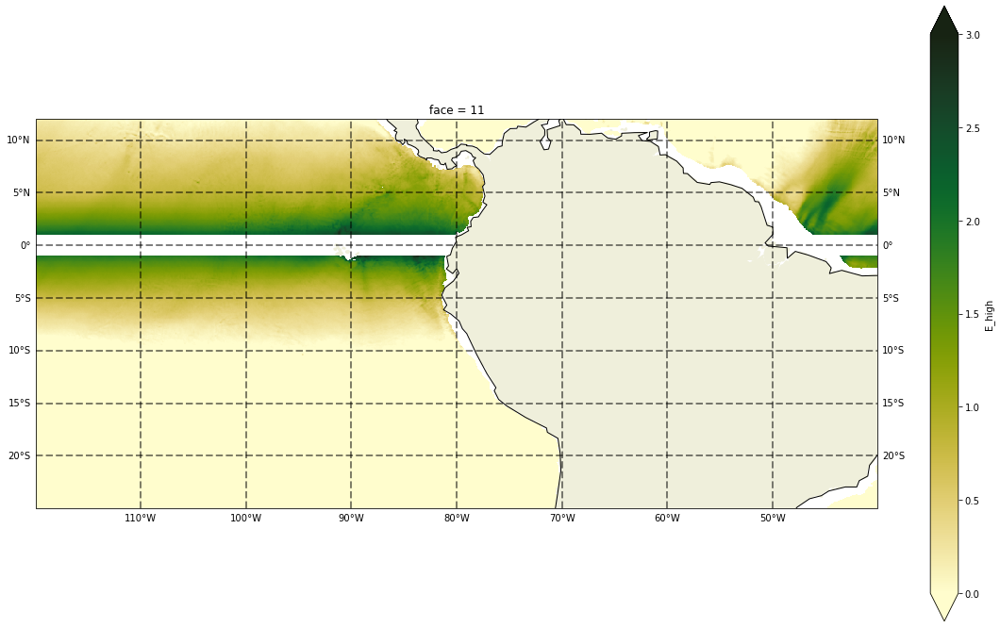

In [69]:
E_low_4 = ds_ageo_all.E_high.isel(face=face)
eta1=np.log10(E_low_4.isel(i=slice(1,-1),j=slice(1,-1))).where( (ice>0) & (np.abs(E_low_4.YC)>1) & (E_low_4.Depth>500) )

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
eta1.plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=0, vmax=3, cmap=cm.speed)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
ax.coastlines(resolution='110m', color='k')
ax.add_feature(cfeature.LAND)   
ax.set_ylim(-25., 12.)
ax.set_xlim(-120., -40.)

In [73]:
font_size = 15
linewidith = 0.5

def plot_scalar_face01(v1, v2, v3, v4, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                       offline=False, figsize=(15,10), cmap=None):
    #
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)

        try:
            
            ## subplot 221
            ax = fig.add_subplot(321, projection=ccrs.PlateCarree())
            im = v1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            #cax = plt.axes([0.925, 0.25, 0.025, 0.5])
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[0],fontsize=font_size) 
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
            
            ## subplot 222
            ax = fig.add_subplot(322, projection=ccrs.PlateCarree())
            im = v2.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[1],fontsize=font_size)                        
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
                   
            ## subplot 223
            ax = fig.add_subplot(323, projection=ccrs.PlateCarree())
            im = v3.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[2],fontsize=font_size)                        
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
                        
            ## subplot 224
            ax = fig.add_subplot(324, projection=ccrs.PlateCarree())
            im = v4.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cb=fig.colorbar(im)
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[3],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
 
                        
            ## subplot 224
            ax = fig.add_subplot(325, projection=ccrs.PlateCarree())
            im = eta2.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=-2, vmax=0,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cm.speed)
            cb=fig.colorbar(im, ticks=[-2,-1,0])
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[4],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    
            
                        
            ## subplot 224
            ax = fig.add_subplot(326, projection=ccrs.PlateCarree())
            im = eta1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=-1, vmax=2,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cm.speed)
            cb=fig.colorbar(im, ticks=[-1, 0, 1, 2])
            ax.grid(linewidth=linewidith , color='k', alpha=0.5, linestyle='--')
            ax.set_title(title[5],fontsize=font_size)    
            cb.set_label(label=label[0], fontsize=font_size)
            cb.ax.tick_params(labelsize=font_size)
            ax.set_xlim(-120., -40.)
            ax.set_xticks([-120., -105., -90., -75., -60., -45.])
            ax.set_xticklabels(['$120\degree$W','$105\degree$W','$90\degree$W','$75\degree$W','$60\degree$W','$45\degree$W'])
            ax.set_ylim(-25., 12.)
            ax.set_yticks([-20., -10., 0., 10.])
            ax.set_yticklabels(['$20\degree$S','$10\degree$S','$0\degree$','$10\degree$N'])
            ax.tick_params(direction='out', length=4, width=1.5)
            ax.set_ylabel('',fontsize=font_size)
            ax.set_xlabel('',fontsize=font_size)
            ax.tick_params(labelsize=font_size)
            ax.coastlines(resolution='110m', color='k')
            ax.add_feature(cfeature.LAND)    


            #plt.subplots_adjust(wspace = 0.05)
                     
        except:
            pass
          
        if savefig is not None:
            fig.savefig(savefig, dpi=600)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [78]:
vmin, vmax = -2, 2
lds = ds

def process(ds, i, overwrite=True):    
    
    u = ds['u'].where( (ice>0) & (ds.Depth>500) )
    ug = ds['u_geo'].where( (ice>0) & (ds.Depth>500) & (np.abs(ds.YC)>1) )
    ua = ds['u_ageo'].where( (ice>0) & (ds.Depth>500) & (np.abs(ds.YC)>1) )
    eta = ds['Eta'].where( (ice>0) & (ds.Depth>500) )
    
    #mtime = ds['time'].values/86400
    mtime = time_day[i]
    figname = '/home/uz/yux/mit_equinox_backup/hal/Geostrophy_assessment/Figures/U_Movies/All_U_f%02d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['%s \n $\eta$ (m)' %mtime, 'u (m/s)', '$u_g$ (m/s)', '$u_a$ (m/s)', '$KE_{a,low}$ (m$^2$/s$^{-2}$)', '$KE_{a,high}$ (m$^2$/s$^{-2}$)']
        #label = ['$\eta$ (m)', 'u (m/s)', '$u_g$ (m/s)', '$u_a$ (m/s)']
        label = ['', '', '', '']
        
        plot_scalar_face01(eta, u, ug, ua, colorbar=False, title=title, label=label, savefig=figname, vmin=vmin, vmax=vmax,
                           offline=False, figsize=(15,10), cmap=cm.balance)
        #
        m = float(u.mean().values)
    else:
        m = -1.
    return m

#I = range(len(ds['time']))
I = range(0,144)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]

range(0, 144)


In [79]:
futures = client.compute(values)
%time results = client.gather(futures)

CPU times: user 1min 17s, sys: 54.1 s, total: 2min 11s
Wall time: 10min 20s
